In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

In [2]:
# Specify the directories containing images and masks
image_directory = "./images"
mask_directory = "./boxes"

In [3]:
# Load images
images = []
for filename in os.listdir(image_directory):
    if filename.endswith(".png"):
        image_path = os.path.join(image_directory, filename)
        image = cv2.imread(image_path)

        if image is not None:
            images.append(image)


[array([[[128, 134, 129],
        [132, 138, 133],
        [134, 140, 135],
        ...,
        [250, 248, 248],
        [243, 241, 241],
        [255, 254, 254]],

       [[137, 143, 138],
        [145, 151, 146],
        [146, 152, 147],
        ...,
        [255, 255, 255],
        [251, 251, 251],
        [250, 250, 250]],

       [[103, 107, 102],
        [ 82,  86,  81],
        [ 69,  73,  68],
        ...,
        [244, 249, 248],
        [238, 244, 243],
        [237, 243, 242]],

       ...,

       [[167, 175, 175],
        [159, 167, 166],
        [147, 155, 155],
        ...,
        [210, 225, 221],
        [213, 230, 227],
        [213, 230, 227]],

       [[ 72,  79,  76],
        [ 65,  72,  69],
        [ 40,  47,  44],
        ...,
        [129, 143, 141],
        [137, 151, 150],
        [145, 159, 158]],

       [[ 37,  43,  38],
        [ 54,  60,  55],
        [ 52,  58,  53],
        ...,
        [122, 134, 134],
        [117, 129, 131],
        [113, 125, 127]

In [4]:
masks = []
for image in images:
    filename = os.path.basename(image_directory) + "_" + os.path.basename(image_directory) + ".png"
    mask_path = os.path.join(mask_directory, filename)
    mask = cv2.imread(mask_path)

    if mask is not None:
        # Convert the mask to grayscale
        mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

        # Threshold to separate occupied (red) and empty (blue) spaces
        _, thresholded = cv2.threshold(mask_gray, 150, 255, cv2.THRESH_BINARY)

        masks.append(thresholded)

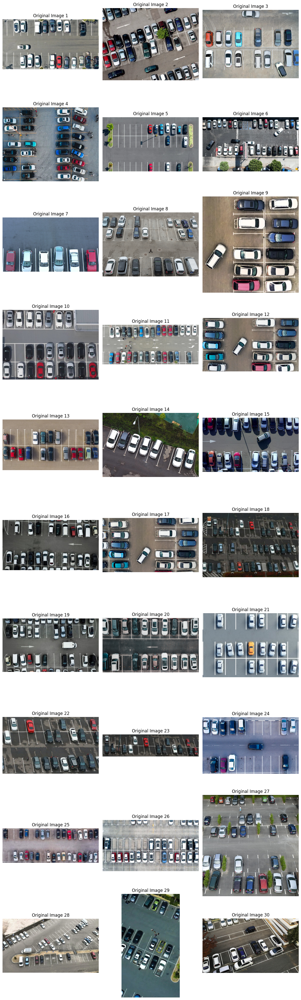

In [5]:
# Display original images in a grid
num_images = len(images)
num_cols = 3 
num_rows = -(-num_images // num_cols)

display_titles = [f'Original Image {i+1}' for i in range(len(images))]
plt.figure(figsize=(num_cols * 4, num_rows * 4))  # Adjust figure size based on the grid
for i in range(len(images)):
    plt.subplot(num_rows, num_cols, i+1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(display_titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

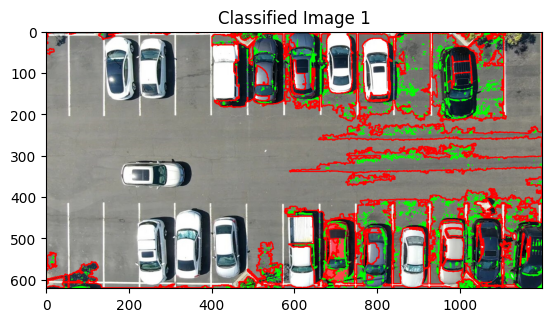

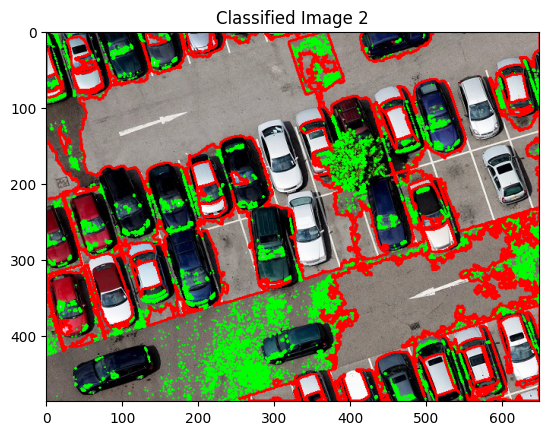

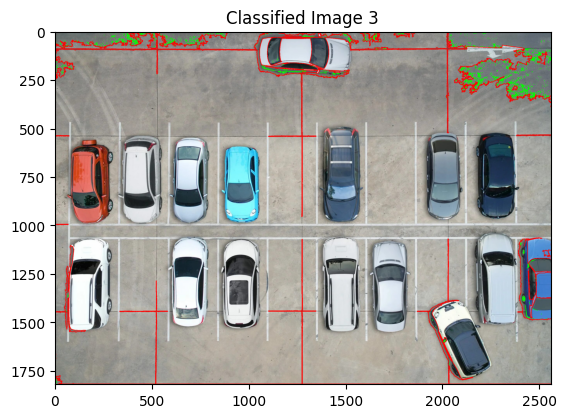

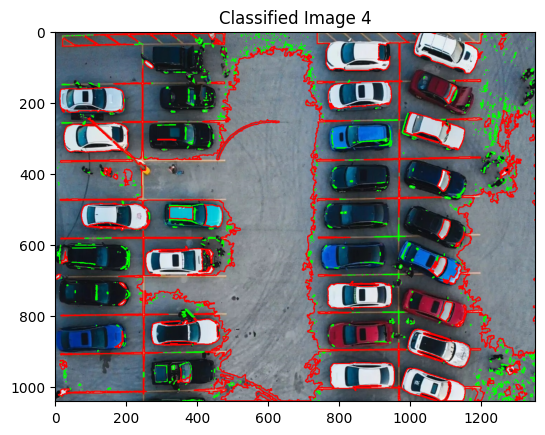

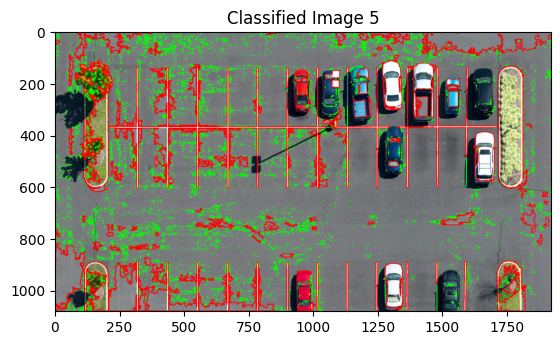

...

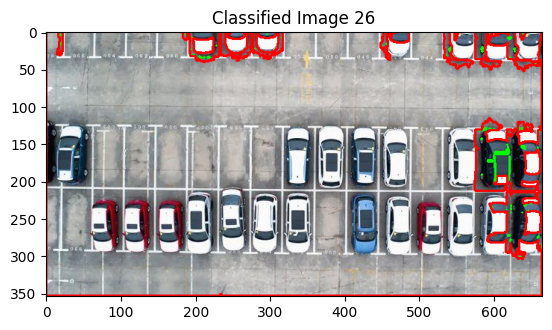

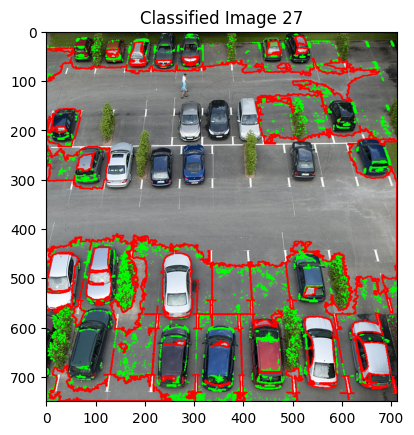

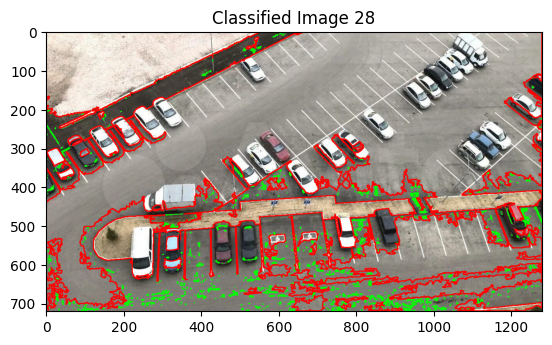

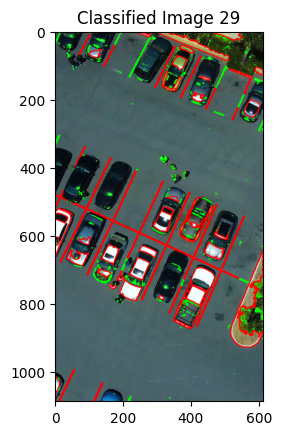

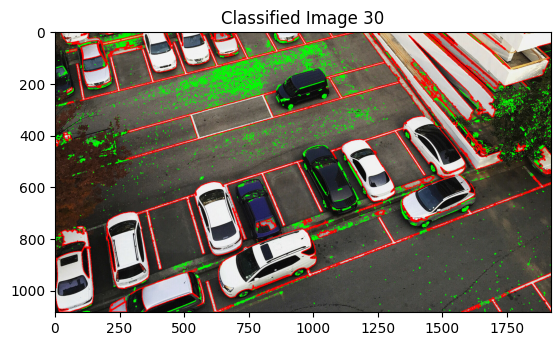

In [6]:
# Classify parking spaces and display the results
for i in range(len(images)):
    original_image = images[i].copy()

    # Convert the image to grayscale
    gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

    # Apply a threshold to the grayscale image
    _, thresholded = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)

    # Find contours in the thresholded image
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Iterate through contours and classify each parking space
    for contour in contours:
        # Calculate the area of the contour
        area = cv2.contourArea(contour)

        # You may need to adjust this threshold based on your images
        if area > 100:
            # Assume the parking space is occupied (draw in red)
            cv2.drawContours(original_image, [contour], -1, (0, 0, 255), 2)
        else:
            # Assume the parking space is empty (draw in green)
            cv2.drawContours(original_image, [contour], -1, (0, 255, 0), 2)

    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Classified Image {i+1}')
    plt.show()

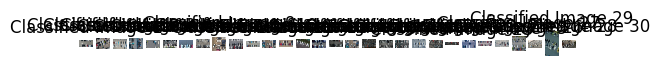

In [7]:
# Display original and classified images side by side
classified_titles = [f'Classified Image {i+1}' for i in range(len(images))]
for i in range(len(images)):
    plt.subplot(1, len(images), i+1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(classified_titles[i])
    plt.axis('off')
plt.show()